In [26]:
import sys
sys.path.append('/Users/siner/repositories/opensource/bemusic/bms2mp3')

filename = '../mp3_files/M/mk D (by M-kani).mp3'

In [27]:
# extract bpm
import librosa
import numpy as np
y, sr = librosa.load(filename)
y, index = librosa.effects.trim(y)
onset_env = librosa.onset.onset_strength(y=y, sr=sr, aggregate=np.median)
tempo, beat_times = librosa.beat.beat_track(y=y, sr=sr, onset_envelope=onset_env, units="time")
print(tempo)
# print(beat_frames)
# beat_times = librosa.frames_to_time(beat_frames, sr=sr)
# print(beat_times)


129.19921875


In [28]:
# beat_times = [beat_time - beat_times[0] for beat_time in beat_times]

In [ ]:
import IPython.display as ipd

ipd.Audio(y, rate=sr)

In [60]:
# onset detection
sliced_y = y #[int(beat_times[30] * sr):int(beat_times[50] * sr)]

# get onset over -0.3dB
o_env = librosa.onset.onset_strength(y=sliced_y, sr=sr)
onset_subbands = librosa.onset.onset_strength_multi(y=sliced_y, sr=sr, channels=[0, 32, 64, 96, 128, 320, 3000])
print(len(librosa.onset.onset_detect(onset_envelope=onset_subbands[0], sr=sr)))
print(len(librosa.onset.onset_detect(onset_envelope=onset_subbands[1], sr=sr)))
print(len(librosa.onset.onset_detect(onset_envelope=onset_subbands[2], sr=sr)))
print(len(librosa.onset.onset_detect(onset_envelope=onset_subbands[3], sr=sr)))

o_env = onset_subbands[1]
onset_frames = librosa.onset.onset_detect(onset_envelope=o_env, sr=sr)
print(len(onset_frames))
times = librosa.times_like(o_env, sr=sr)

378
378


In [61]:
import matplotlib.pyplot as plt
D = np.abs(librosa.stft(sliced_y))
plt.rcParams["figure.figsize"] = (200, 100)
fig, ax = plt.subplots(nrows=1)
ax.plot(times, o_env, label='Onset strength')
ax.vlines(times[onset_frames], 0, o_env.max(), color='r', alpha=0.9, linestyle='--', label='Onsets')
ax.legend()

In [6]:
# ipd.Audio(sliced_y, rate=sr)


해당 데이터가 박자/노트가 나오는 시점을 뜻한다.

In [62]:
[num for num in times[onset_frames]]

[0.06965986394557823,
 1.8343764172335602,
 2.089795918367347,
 2.414875283446712,
 2.995374149659864,
 3.2275736961451247,
 3.436553287981859,
 3.6687528344671203,
 3.900952380952381,
 4.2260317460317465,
 4.806530612244898,
 5.2477097505668935,
 5.479909297052155,
 6.060408163265306,
 6.617687074829932,
 6.873106575963718,
 7.082086167800454,
 7.291065759637188,
 7.546485260770975,
 7.87156462585034,
 8.428843537414966,
 8.893242630385487,
 9.102222222222222,
 9.357641723356009,
 9.7059410430839,
 10.263219954648527,
 10.727619047619047,
 10.936598639455783,
 11.517097505668934,
 12.07437641723356,
 12.538775510204081,
 12.747755102040816,
 13.003174603174603,
 13.328253968253968,
 13.885532879818594,
 14.349931972789115,
 14.55891156462585,
 15.046530612244897,
 15.162630385487528,
 15.27873015873016,
 15.603809523809524,
 15.719909297052155,
 15.836009070294784,
 16.16108843537415,
 16.39328798185941,
 16.857687074829933,
 17.08988662131519,
 17.41496598639456,
 17.647165532879818,

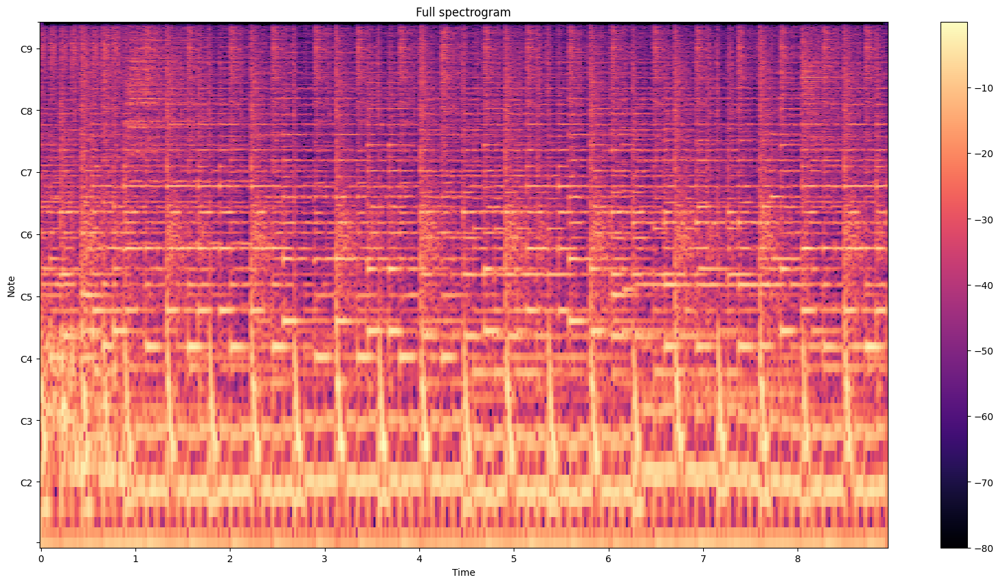

In [7]:
# plt.rcParams["figure.figsize"] = (20, 10)
# fig = None
# fig, ax = plt.subplots(nrows=1)
# rp = np.max(np.abs(D))
# img = librosa.display.specshow(librosa.amplitude_to_db(np.abs(D), ref=rp),
#                                y_axis='fft_note', x_axis='time', ax=ax)
# ax.set(title='Full spectrogram')
# ax.label_outer()
#
# fig.colorbar(img, ax=ax)

In [4]:
# from matplotlib import pyplot as plt
# D = librosa.stft(y)
# D_harmonic, D_percussive = librosa.decompose.hpss(D, margin=(8, 8))
#
# # Pre-compute a global reference power from the input spectrum
# rp = np.max(np.abs(D))
#
# lead_sound_y = librosa.istft(D_harmonic, length=len(y))
# percussion_sound_y = librosa.istft(D_percussive, length=len(y))

In [5]:
# # normalize
# lead_sound_y = librosa.util.normalize(lead_sound_y)
# percussion_sound_y = librosa.util.normalize(percussion_sound_y)

In [6]:
# plt.rcParams["figure.figsize"] = (20, 10)
# fig, ax = plt.subplots(nrows=3, sharex=True, sharey=True)
#
# img = librosa.display.specshow(librosa.amplitude_to_db(np.abs(D), ref=rp),
#                                y_axis='log', x_axis='time', ax=ax[0])
# ax[0].set(title='Full spectrogram')
# ax[0].label_outer()
#
# librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_harmonic), ref=rp),
#                          y_axis='log', x_axis='time', ax=ax[1])
# ax[1].set(title='Harmonic spectrogram')
# ax[1].label_outer()
#
# librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_percussive), ref=rp),
#                          y_axis='log', x_axis='time', ax=ax[2])
# ax[2].set(title='Percussive spectrogram')
# fig.colorbar(img, ax=ax)

In [ ]:
from music21 import corpus

allBach = corpus.search('bach')

x = allBach[0]
p = x.parse()

partStream = p.parts.stream()

for n in p.flat.notes:
    print "Note: %s%d %0.1f" % (n.pitch.name, n.pitch.octave, n.duration.quarterLength)

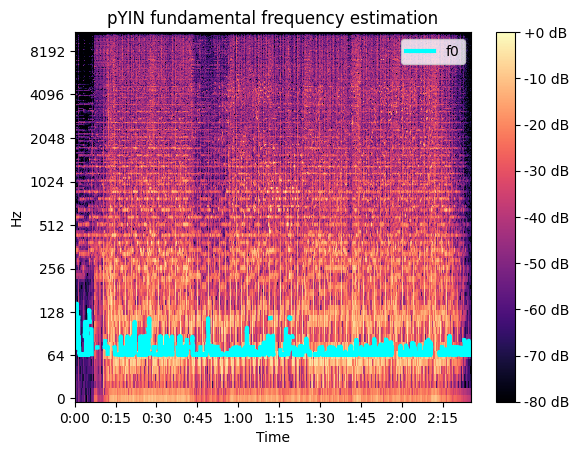

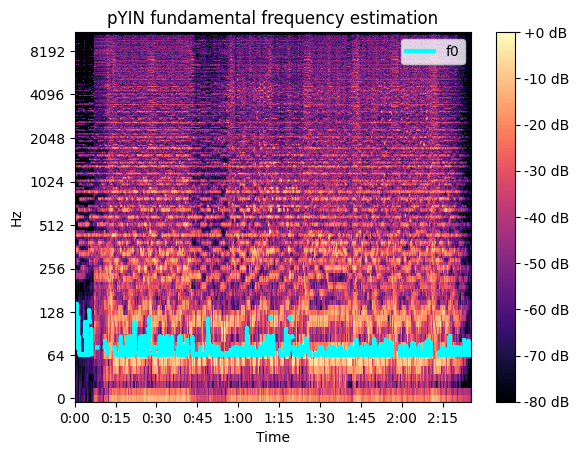

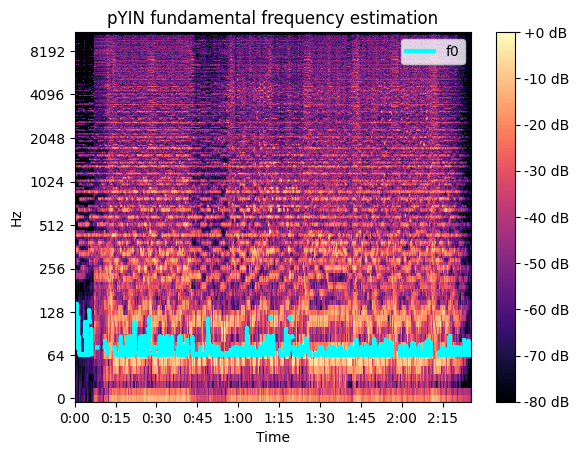

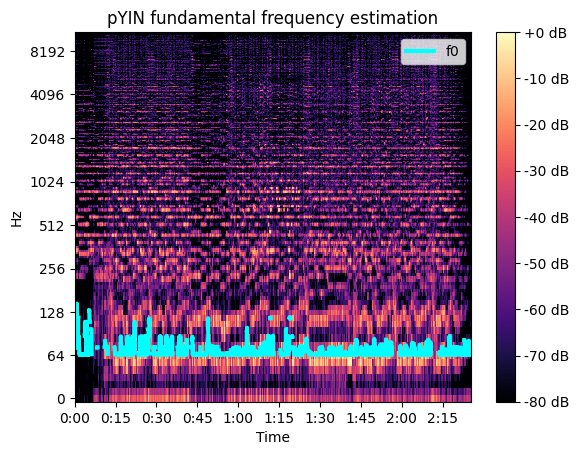

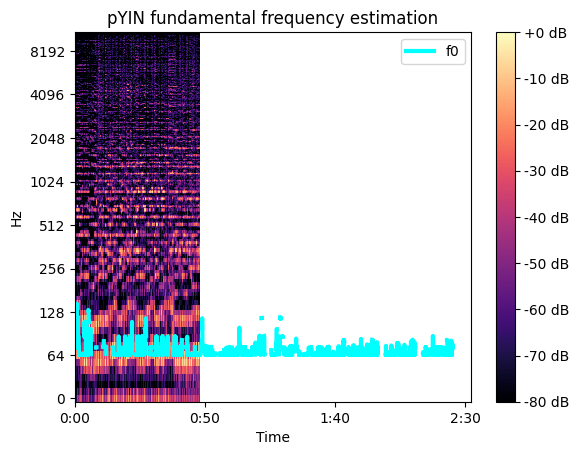

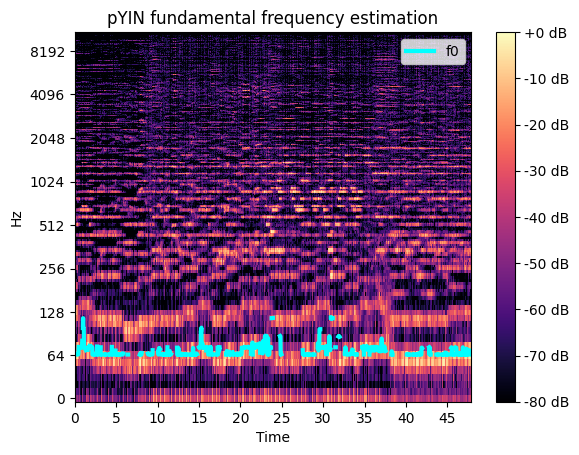

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [25]:
sliced_y = y[int(beat_times[int(len(beat_times) / 3)] * sr):int(beat_times[int(2 * len(beat_times) / 3)] * sr)]
f0, voiced_flag, voiced_probs = librosa.pyin(sliced_y,
                                             fmin=librosa.note_to_hz('C2'),
                                             fmax=librosa.note_to_hz('C7'))
times = librosa.times_like(f0)
import matplotlib.pyplot as plt

D_harmonic, D_percussive = librosa.decompose.hpss(librosa.stft(sliced_y), margin=5)
D = librosa.amplitude_to_db(np.abs(D_harmonic), ref=np.max)
fig, ax = plt.subplots()
img = librosa.display.specshow(D, x_axis='time', y_axis='log', ax=ax)
ax.set(title='pYIN fundamental frequency estimation')
fig.colorbar(img, ax=ax, format="%+2.f dB")
ax.plot(times, f0, label='f0', color='cyan', linewidth=3)
ax.legend(loc='upper right')

In [26]:
ipd.Audio(librosa.istft(D_harmonic), rate=sr)


In [27]:
import soundfile as sf
sf.write('test.wav', librosa.istft(D_harmonic), sr)

In [9]:
# ipd.Audio(percussion_sound_y, rate=sr)

마디별로 쪼개면 pad 사운드같은게 전부 노트로 변경되어 버리기에 아래 코드는 우선 주석처리함

In [10]:
# # split music by beat_times
# splited_sounds = []
# for i, beat_time in enumerate(beat_times):
#     if i == len(beat_times) - 1:
#         break
#     one = int(beat_times[i] * sr)
#     three = int((beat_times[i] + beat_times[i + 1]) / 2 * sr)
#     five = int(beat_times[i + 1] * sr)
#     # splited_sounds.append(y[one:three])
#     # splited_sounds.append(y[three:five])
#
#
#     two = int((one + three) / 2)
#     four = int((three + five) / 2)
#     splited_sounds.append(y[one:two])
#     splited_sounds.append(y[two:three])
#     splited_sounds.append(y[three:four])
#     splited_sounds.append(y[four:five])

In [11]:
# ipd.Audio(splited_sounds[1], rate=sr)

In [12]:
# from matplotlib import pyplot as plt
#
# plt.rcParams["figure.figsize"] = (20, 10)
# fig, ax = plt.subplots(nrows=1)
# D = np.abs(librosa.iirt(y))
# rp = np.max(np.abs(D))
# img = librosa.display.specshow(
#     librosa.amplitude_to_db(D, ref=rp),
#     y_axis='log', x_axis='time', ax=ax,
# )
# fig.colorbar(img, ax=ax)

In [13]:
from utils.pitch_extractor import bestpitch

In [14]:

# lead sound pitch extraction
# notes_list = []
# for i, sound in enumerate(splited_sounds):
#     # extract loudest pitch
#     pitches = bestpitch(y=sound, sr=sr)
#     notes = librosa.hz_to_note(pitches)
#     notes_list.append(notes[0])


In [17]:

# lead sound pitch extraction
notes_list = []
for i, sound in enumerate(splited_sounds):
    # extract loudest pitch
    pitches, magnitudes = librosa.core.piptrack(y=sound, sr=sr)
    # pitch = librosa.core.pitch_tuning(pitches, bins_per_octave=12)
    midi_notes = librosa.hz_to_note(pitches)
    notes_list.append(midi_notes)


/Users/siner/repositories/opensource/bemusic/bms2mp3/venv/lib/python3.9/site-packages/librosa/core/convert.py:1107: RuntimeWarning: divide by zero encountered in log2
  midi: np.ndarray = 12 * (np.log2(np.asanyarray(frequencies)) - np.log2(440.0)) + 69


OverflowError: cannot convert float infinity to integer

In [ ]:
from utils.midi2array import midi2array

hz_list = [librosa.note_to_hz(note) for note in notes_list]
tones = [librosa.tone(hz, sr=sr, duration=0.1) for hz in hz_list]
result = np.concatenate(tones)
ipd.Audio(result, rate=sr)

In [ ]:
ipd.Audio(splited_sounds[0], rate=sr)

In [ ]:
import soundfile as sf
sf.write('test.wav', splited_sounds[1], sr)

In [ ]:
# from matplotlib import pyplot as plt
#
# plt.rcParams["figure.figsize"] = (20, 10)
# fig, ax = plt.subplots(nrows=1)
# D = np.abs(librosa.stft(splited_sounds[0]))
# rp = np.max(np.abs(D))
# img = librosa.display.specshow(
#     librosa.amplitude_to_db(D, ref=rp),
#     y_axis='log', x_axis='time', ax=ax,
# )
# fig.colorbar(img, ax=ax)

In [ ]:
print(len(splited_sounds))

In [ ]:
# split music by beats



In [ ]:
# extract pitches
